In [1]:
import sys
sys.path.append('../MENAV/')
import femder as fd
import numpy as np
import matplotlib.pyplot as plt


path_to_geo = "Info/acousticave.geo"
AP = fd.AirProperties(c0 = 343)
AC = fd.AlgControls(AP,1,200,0.5)

S = fd.Source("spherical",coord=[[1.547, 0.23 , 0.35]], q = [0.001])
R = fd.Receiver(coord=[-2.025,  2.389,  2.08])


BC = fd.BC(AC,AP)
BC.normalized_admittance(2,0.012)
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 200,num_freq=12,scale=1,order=1)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)


In [7]:
from matplotlib import pyplot as plt
from matplotlib import ticker, gridspec
def plot_2d_freq(x, y, xlabel=None, ylabel=None, save_fig=False, xlim=None, ylim=None, title=None, legend_list=[],
                 linestyle_list=None, project_folder=None):
    plt.style.use('seaborn-colorblind')
    hex_list = ['#67a9cf', '#b2182b', '#fddbc7','#d1e5f0','#2166ac', '#ef8a62']
    fig = plt.figure(figsize=(16, 9))
    ax1 = None
    gs = gridspec.GridSpec(1, 1)
    base_fontsize = 18

    if isinstance(y, list):
        y = np.asarray(y).squeeze()

    if linestyle_list is None:
        linestyle_list = ["-"]

    freq = x
    mag = y.T

    ax1 = plt.subplot(gs[0, 0])
    
    if len(mag.shape) == 1:
        ax1.semilogx(freq,
             mag,
             linewidth=4,
            label=legend_list[0],
            linestyle = linestyle_list[0],
                color= hex_list[0]) 
    else:
        for i in range(len(mag[0,:])):
            ax1.semilogx(freq,
                         mag[:,i],
                         linewidth=4,
                        label=legend_list[i],
                        linestyle = linestyle_list[i],
                        color= hex_list[i])
    if ylim is None:
        ax1.set_ylim([np.amin(mag) - np.amin(mag) * 0.1,
                      np.amax(mag) + np.amin(mag) * 0.1])
    if xlim is None:
        ax1.set_xlim([min(freq), max(freq)])
    else:
        ax1.set_ylim(ylim)
    ax1.set_xlim(xlim)
    ax1.set_xlabel(xlabel, fontsize=base_fontsize - 1)
    ax1.set_ylabel(ylabel, fontsize=base_fontsize - 1)
    ax1.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
    ax1.get_xaxis().set_minor_formatter(ticker.ScalarFormatter())
    ax1.tick_params(which="minor", length=5, rotation=-90, axis="x")
    ax1.tick_params(which="major", length=5, rotation=-90, axis="x")
    ax1.tick_params(axis="both", which="both", labelsize=base_fontsize - 2)
    ax1.minorticks_on()
    ax1.legend(prop={'size': 18})
#     for line, ls in zip(ax1.get_lines(), linestyle_list):
#         line.set_linestyle(ls)
    ax1.grid("major", axis='both')
    ax1.set_title(title,
                  size=base_fontsize + 2,
                  fontweight="bold",
                  loc="left")

    gs.tight_layout(fig, pad=2)
    if save_fig:
        fig.savefig(project_folder + f'\\{title}.png',
                    dpi=300,
                    transparent=True,
                    bbox_inches='tight')

    return fig

In [3]:
obj.plot_problem(saveFig=True,camera_angles=['diagonal_front'],extension='pdf')

## 6 elements per wavelenght - Order 1

In [2]:
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 300,num_freq=6,scale=1,order=1)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)
obj.compute()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 399/399 [00:13<00:00, 29.68it/s]

Time taken: 16.707921504974365 s


In [3]:
import pytta
dir = 'D:\\Documents\\UFSM\\MNAV\\Validation Acusticave\\Info\\AcoustiCave Measurements\\200212 Thiago Measurement\\200221_acousticave_measurements\\diagonal_corners.wav'
dir = 'D:\\Documents\\UFSM\\MNAV\\Validation Acusticave\\Info\\M0920_S04_R00 - cave.wav'

data = pytta.read_wav(dir)

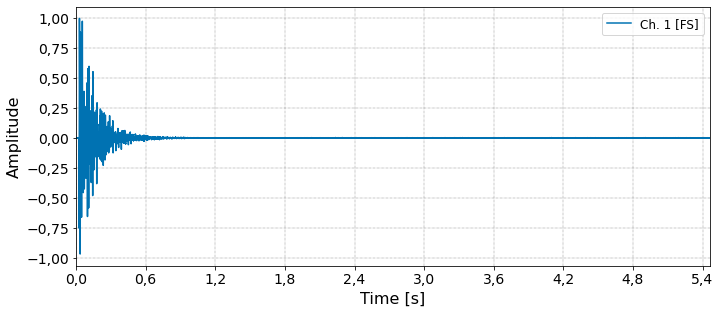

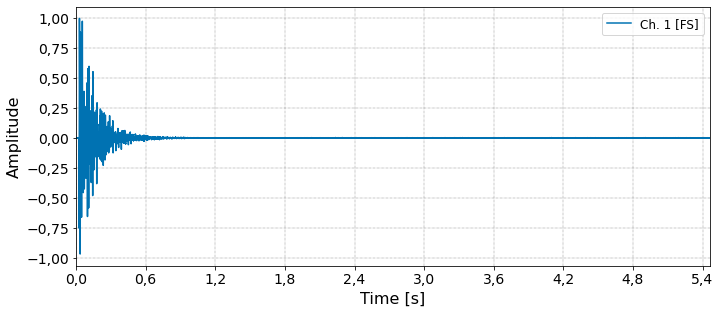

In [4]:
data.plot_time()

New method name in version 0.1.0! Remember to review your code.


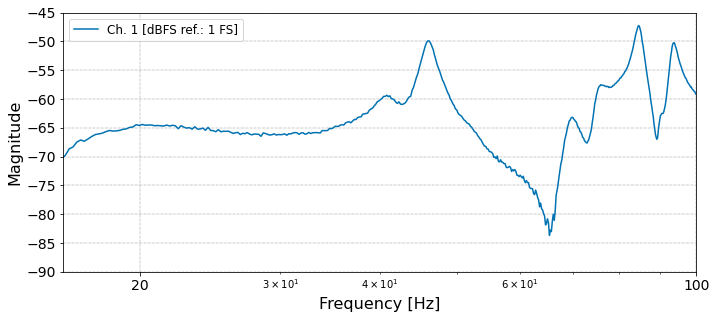

In [4]:
datam = data.channelMean()
datam.plot_freq()
fpexp = datam.freqVector
plt.xlim([16,100])
plt.ylim([-90,-45])
pexp = fd.p2SPL(datam.freqSignal.T).ravel()


In [5]:
np.interp(obj.freq, fpexp, pexp-mpdiff).shape

NameError: name 'mpdiff' is not defined

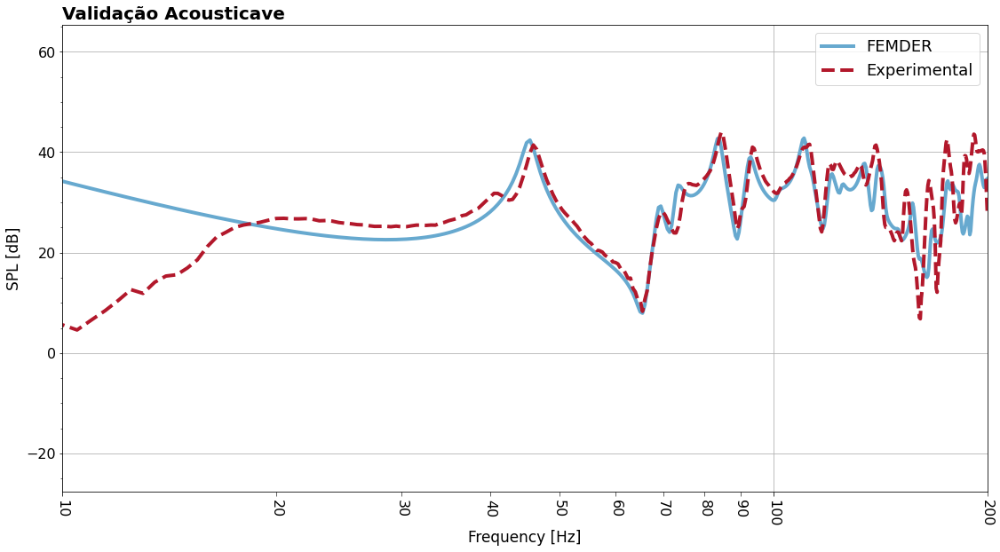

In [13]:

mpexp = np.absolute(np.mean(pexp[109:1650]))
obj.evaluate(R,False);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

fig = plot_2d_freq(obj.freq, [psim, np.interp(obj.freq, fpexp, pexp-mpdiff)], xlim=[10,200],
                               title="Validação Acousticave",
                               xlabel="Frequency [Hz]", ylabel="SPL [dB]",
                               legend_list=['FEMDER', 'Experimental'], linestyle_list=['-', '--'],
                             save_fig=True,
                             project_folder=r'G:\My Drive\R & D\TCC\TCC 2\Figs')

fig.show()

# plt.figure(figsize=(12,8))
# plt.semilogx(fpexp,pexp-mpdiff,label='Experimental')
# plt.semilogx(obj.freq,psim,label='FEM')
# plt.legend()
# plt.grid()
# plt.title('Acousticave Validação FEM - 6elem/wl - Ordem 1')
# plt.xticks([20,40,60,80,100,120,160,200],[20,40,60,80,100,120,160,200]);
# plt.xlim([20,200])
# plt.ylim([np.amin(psim)-5,np.amax(psim)+5])

In [ ]:
data = np.genfromtxt('info/valid_from_paper_exp.csv')
pexp = data[:,1]
fexp = data[:,0]
mpexp = np.mean(pexp)
obj.evaluate(R,False);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

plt.semilogx(fexp,pexp-mpdiff,label='Experimental')
plt.semilogx(obj.freq,psim,label='FEM')
plt.legend()
plt.grid()
plt.title('Acousticave Validação FEM - 6elem/wl - Ordem 1')
plt.xticks([20,40,60,80,100,120,160,200],[20,40,60,80,100,120,160,200]);
plt.xlim([20,200])


## 12 elements per wavelenght - Order 1

In [5]:
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 200,num_freq=12,scale=1,order=1)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)
obj.compute()

100%|████████████████████████████████████████████████████████████████████████████████| 361/361 [00:29<00:00, 12.09it/s]

Time taken: 37.04270601272583 s


In [27]:
obj.pressure_field(frequencies=[65],saveFig=True,filename=r'G:\My Drive\R & D\TCC\TCC 2\Figs\field_65', extension='pdf')


Info/acousticave.geo


100%|█████████████████████████████████████████████████████████████████████████████| 1316/1316 [00:01<00:00, 662.20it/s]



	Elapsed time to evaluate acoustic field: 0.19 minutes



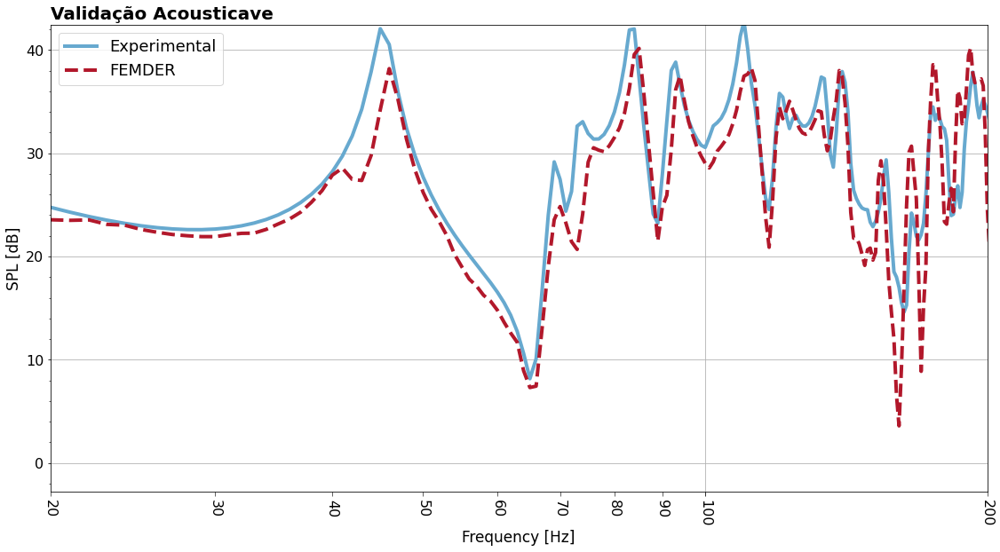

In [158]:
# data = np.genfromtxt('info/valid_from_paper_exp.csv')
mpexp = np.absolute(np.mean(pexp[109:1650]))
obj.evaluate(R,False);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

fig = plot_2d_freq(obj.freq, [psim, np.interp(obj.freq, fpexp, pexp-mpdiff)], xlim=[20,200],
                               title="Validação Acousticave",
                               xlabel="Frequency [Hz]", ylabel="SPL [dB]",
                               legend_list=['Experimental', 'FEMDER'], linestyle_list=['-', '--'],
                             save_fig=True,
                             project_folder=r'G:\My Drive\R & D\TCC\TCC 2\Figs')

fig.show()



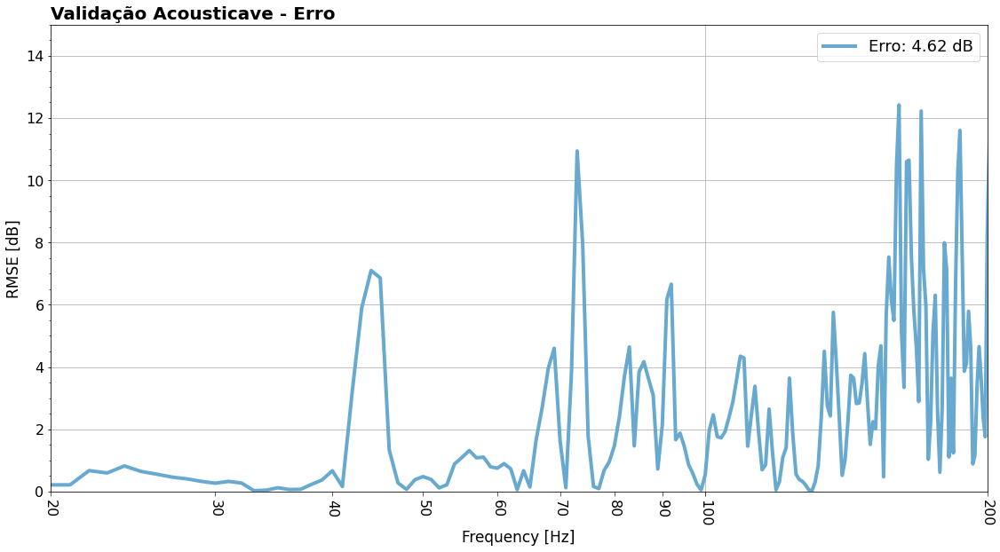

In [166]:
# data = np.genfromtxt('info/valid_from_paper_exp.csv')
mpexp = np.absolute(np.mean(pexp[109:1650]))
obj.evaluate(R,False);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

exp = np.interp(obj.freq, fpexp, pexp-mpdiff)
sim = psim-1

error =  np.sqrt((exp-sim)**2) 


fig = plot_2d_freq(obj.freq, error, xlim=[20,200], ylim = [0,15],
                               title="Validação Acousticave - Erro",
                               xlabel="Frequency [Hz]", ylabel="RMSE [dB]",
                               legend_list=[f'Erro: {error.mean():.2f} dB', 'FEMDER'], linestyle_list=['-'],
                             save_fig=True,
                             project_folder=r'G:\My Drive\R & D\TCC\TCC 2\Figs')

fig.show()



## 6 elements per wavelenght - Order 2

In [84]:
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 200,num_freq=6,scale=1,order=2, load_method=False)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)
obj.compute()

100%|████████████████████████████████████████████████████████████████████████████████| 281/281 [00:33<00:00,  8.37it/s]

Time taken: 42.52171564102173 s


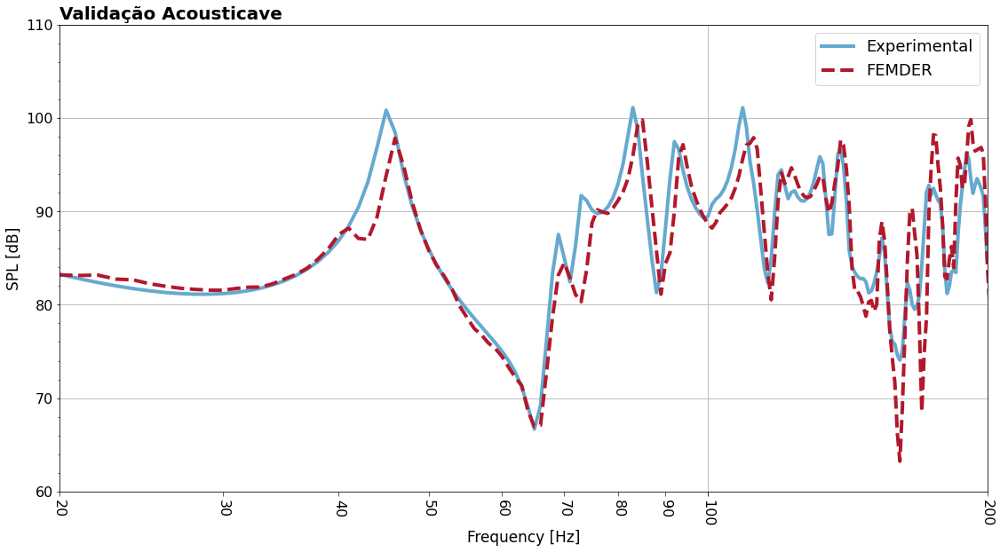

In [88]:
mpexp = np.absolute(np.mean(pexp[109:1650]))
obj.evaluate(R,2);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

fig = plot_2d_freq(obj.freq, [psim-1.5, np.interp(obj.freq, fpexp, pexp-mpdiff)], xlim=[16,200], ylim = [60,110],
                               title="Validação Acousticave",
                               xlabel="Frequency [Hz]", ylabel="SPL [dB]",
                               legend_list=['Experimental', 'FEMDER'], linestyle_list=['-', '--'],
                             save_fig=True,
                             project_folder=r'G:\My Drive\R & D\TCC\TCC 2\Figs')

fig.show()


## 3 elements per wavelenght - Order 2


In [ ]:
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 200,num_freq=3,scale=1,order=2)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)
obj.compute()

In [ ]:
data = np.genfromtxt('info/valid_from_paper_exp.csv')
pexp = data[:,1]
fexp = data[:,0]
mpexp = np.mean(pexp)
obj.evaluate(R,False);
psim = fd.p2SPL(obj.pR.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

plt.figure(figsize=[6*1.618,6])
plt.semilogx(obj.freq,psim,label='FEM',linewidth=5)
plt.semilogx(fexp,pexp-mpdiff,label='Experimental',linewidth=5,linestyle=":",color="orange")
plt.legend()
plt.grid()
plt.title('FEM Validation - Acousticave')
plt.xticks([20,40,60,80,100,120,160,200],[20,40,60,80,100,120,160,200]);
plt.xlim([20,200])
plt.savefig('acousticave_validation_3wl_order2.pdf')

In [ ]:
grid = fd.GridImport3D(AP,path_to_geo,S,R,fmax = 200,num_freq=6,scale=1,order=1)
obj = fd.FEM3D(grid,S,R,AP,AC,BC)
obj.eigenfrequency(neigs=200)

In [ ]:
import time
then = time.time()
pM = obj.modal_superposition(R=R)
print(then-time.time())

In [ ]:
data = np.genfromtxt('info/valid_from_paper_exp.csv')
pexp = data[:,1]
fexp = data[:,0]
mpexp = np.mean(pexp)
psim = fd.p2SPL(pM.flatten()/(1j*obj.w*1.21))
mpsim = np.mean(psim)
mpdiff = mpexp - mpsim

plt.semilogx(fexp,pexp-mpdiff,label='Experimental')
plt.semilogx(obj.freq,psim,label='FEM')
plt.legend()
plt.grid()
plt.title('Acousticave Validação FEM - Modal Superposition - Ordem 1')
plt.xticks([20,40,60,80,100,120,160,200],[20,40,60,80,100,120,160,200]);
plt.xlim([20,200])